In [2]:
import pandas as pd
# import yfinance as yf
# import mplfinance as mpf
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from matplotlib.figure import Figure
import numpy as np
import random
from skimage.color import rgb2gray
%config InlineBackend.figure_formats = ['svg']
%matplotlib inline

In [ ]:
data = yf.download('AAPL','2021-09-01','2021-09-30')
data.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-08-31,152.660004,152.800003,151.289993,151.830002,151.608734,86453100
2021-09-01,152.830002,154.979996,152.339996,152.509995,152.287735,80313700
2021-09-02,153.869995,154.720001,152.399994,153.649994,153.426071,71115500
2021-09-03,153.759995,154.630005,153.089996,154.300003,154.075134,57808700
2021-09-07,154.970001,157.259995,154.389999,156.690002,156.461655,82278300


In [ ]:
mpf.plot(data, type='candle')

In [ ]:
plt.figure()

#define width of candlestick elements
width = .4
width2 = .05

#define up and down prices
up = data[data.Close>=data.Open]
down = data[data.Close<data.Open]

#define colors to use
col1 = 'green'
col2 = 'red'

#plot up prices
plt.bar(up.index,up.Close-up.Open,width,bottom=up.Open,color=col1)
plt.bar(up.index,up.High-up.Close,width2,bottom=up.Close,color=col1)
plt.bar(up.index,up.Low-up.Open,width2,bottom=up.Open,color=col1)

#plot down prices
plt.bar(down.index,down.Close-down.Open,width,bottom=down.Open,color=col2)
plt.bar(down.index,down.High-down.Open,width2,bottom=down.Open,color=col2)
plt.bar(down.index,down.Low-down.Close,width2,bottom=down.Close,color=col2)

#rotate x-axis tick labels
plt.xticks(rotation=45, ha='right')

#display candlestick chart
plt.show()

In [ ]:
def create_matrix(data):
    plt.ioff()
    fig, ax = plt.subplots()
    fig.subplots_adjust(bottom = 0)
    fig.subplots_adjust(top = 1)
    fig.subplots_adjust(right = 1)
    fig.subplots_adjust(left = 0)
    

    ax.plot(data.index, data.iloc[:,0], color='grey')
    ax.set_xticks([])
    ax.set_yticks([])


    canvas = FigureCanvas(fig)


    canvas.draw()
    image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8')
    # image = image.reshape(canvas.get_width_height()[::-1] + (3,))

    return image 

In [ ]:
create_matrix(data)

In [ ]:
fig.canvas.draw()
image_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
image_from_plot = image_from_plot.reshape(fig.canvas.get_width_height()[::-1] + (3,))

In [ ]:
plt.imshow(image_from_plot)

## Create V high

In [ ]:
def create_v_high(as_matrix = False):

    x = list(range(0, 100))

    y = []

    high = random.sample(range(40, 100, 10), 1)[0]
    low = high - 20


    for i, value in enumerate(x):
        if i < low or i > high:
            result = 50 + random.randint(-10, 10)
            y.append(result)
        elif i > low and i < (high + low) / 2:
            result = result + random.randint(-20, 70)
            y.append(result)
        else:
            result = result + random.randint(-40, 10)
            y.append(result)
    
    if as_matrix:
        fig, ax = plt.subplots(figsize = (2, 2))
        fig.subplots_adjust(bottom = 0)
        fig.subplots_adjust(top = 1)
        fig.subplots_adjust(right = 1)
        fig.subplots_adjust(left = 0)

        ax.plot(x, y, color='grey')
        ax.set_xticks([])
        ax.set_yticks([])


        canvas = FigureCanvas(fig)

        canvas.draw()
        image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8')
        image = image.reshape(canvas.get_width_height()[::-1] + (3,))
        image = rgb2gray(image).flatten()

        return image 

    return plt.plot(x, y, color='grey')


In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(20, 5))

create_v_high(ax[0])
create_v_high(ax[1])
create_v_high(ax[2])
create_v_high(ax[3])


<ipython-input-9-696bd7b36ca9>:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (2, 2))


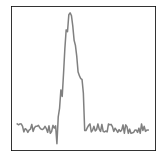

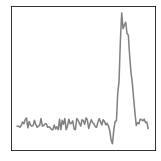

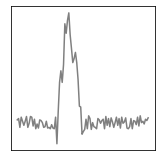

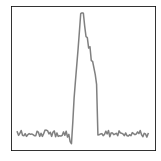

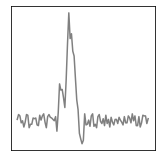

...

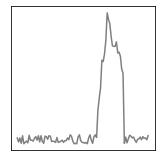

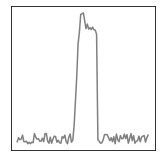

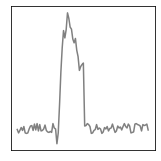

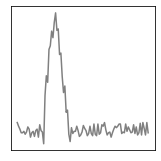

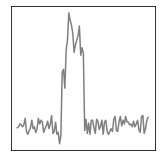

In [ ]:
shape_value = create_v_high(as_matrix=True).shape

set = np.empty([1000, shape_value[0]])

for i, value in enumerate(set):
    set[i] = create_v_high(as_matrix=True)

In [ ]:
main_df = pd.DataFrame(set)
main_df['label'] = 1

main_df.to_csv('proper.csv')

## Create random

In [ ]:
def create_random(as_matrix = False):
    x = list(range(0, 100))

    y = []

    result = 0

    for i, value in enumerate(x):
        z = random.randint(-100, 100)

        w = random.randint(-100, 100)

        if z > w:
            z, w = w, z

        result += random.randint(z, w)
        y.append(result)
    
    if as_matrix:
        fig, ax = plt.subplots(figsize = (2, 2))
        fig.subplots_adjust(bottom = 0)
        fig.subplots_adjust(top = 1)
        fig.subplots_adjust(right = 1)
        fig.subplots_adjust(left = 0)

        ax.plot(x, y, color='grey')
        ax.set_xticks([])
        ax.set_yticks([])


        canvas = FigureCanvas(fig)

        canvas.draw()
        image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8')
        image = image.reshape(canvas.get_width_height()[::-1] + (3,))
        image = rgb2gray(image).flatten()

        return image


    return plt.plot(x, y, color='grey')

<ipython-input-2-31c6593644ec>:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (2, 2))


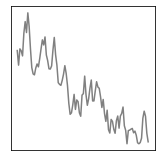

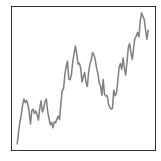

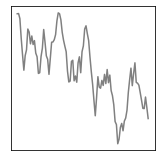

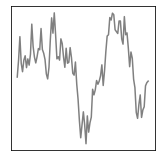

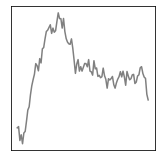

...

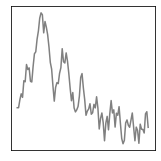

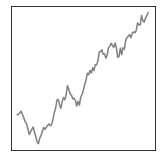

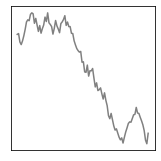

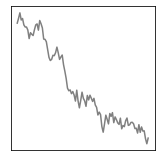

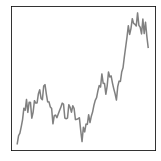

In [ ]:
shape_value = create_random(as_matrix=True).shape

default_set = np.empty([1000, shape_value[0]])

for i, value in enumerate(default_set):
    default_set[i] = create_random(as_matrix=True)

In [ ]:
random_df = pd.DataFrame(default_set)
random_df['label'] = 0

random_df.to_csv('default.csv')

## Głowa i ramiona

In [2]:
def head_and_shoulders(as_matrix = False):

    x = list(range(0, 100))

    y = []

    high = random.sample(range(40, 100, 10), 1)[0]

    low = high - 40

    result = 50

    fold = 5

    adjust = ((high - low) / fold)
    
    for i, value in enumerate(x):
        if i <= low or i >= high:
            result = result + random.randint(-15, 10)
            y.append(result)
        elif i > low and i <= low + adjust:
            result = result + random.randint(-2, 20)
            y.append(result)
        elif i > low + adjust and i <= low + 2 * adjust:
            result = result + random.randint(-20, 0)
            y.append(result)
        elif i > low + 2 * adjust and i <= low + 3 * adjust:
            result = result + random.randint(0, 40)
            y.append(result)
        elif i > low + 3 * adjust and i <= low + 4 * adjust :
            result = result + random.randint(-40, 0)
            y.append(result)
        else:
            result = result + random.randint(-2, 20)
            y.append(result)
    
    if as_matrix:
        fig, ax = plt.subplots(figsize = (2, 2))
        fig.subplots_adjust(bottom = 0)
        fig.subplots_adjust(top = 1)
        fig.subplots_adjust(right = 1)
        fig.subplots_adjust(left = 0)

        ax.plot(x, y, color='grey')
        ax.set_xticks([])
        ax.set_yticks([])


        canvas = FigureCanvas(fig)

        canvas.draw()
        image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8')
        image = image.reshape(canvas.get_width_height()[::-1] + (3,))
        image = rgb2gray(image).flatten()

        return image 

    return plt.plot(x, y, color='grey')

In [4]:
shape_value = head_and_shoulders(as_matrix=True).shape

default_set = np.empty([1000, shape_value[0]])

for i, value in enumerate(default_set):
    default_set[i] = head_and_shoulders(as_matrix=True)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
head_df = pd.DataFrame(default_set)
head_df['label'] = 1

head_df.to_csv('head_shoulders.csv')

## Podwójny szczyt

In [50]:
def double_top(as_matrix = False):

    x = list(range(0, 100))

    y = []

    high = random.sample(range(40, 100, 10), 1)[0]

    low = high - 40

    result = 50

    fold = 5

    adjust = ((high - low) / fold)
    
    for i, value in enumerate(x):
        if i <= low or i >= high:
            result = result + random.randint(-15, 10)
            y.append(result)
        elif i > low and i <= low + adjust:
            result = result + random.randint(0, 30)
            y.append(result)
        elif i > low + adjust and i <= low + 2 * adjust:
            result = result + random.randint(-30, 0)
            y.append(result)
        elif i > low + 2 * adjust and i <= low + 3 * adjust:
            result = result + random.randint(0, 30)
            y.append(result)
        elif i > low + 3 * adjust and i <= low + 4 * adjust :
            result = result + random.randint(-30, 0)
            y.append(result)
        else:
            result = result + random.randint(-15, 10)
            y.append(result)
    
    if as_matrix:
        fig, ax = plt.subplots(figsize = (2, 2))
        fig.subplots_adjust(bottom = 0)
        fig.subplots_adjust(top = 1)
        fig.subplots_adjust(right = 1)
        fig.subplots_adjust(left = 0)

        ax.plot(x, y, color='grey')
        ax.set_xticks([])
        ax.set_yticks([])


        canvas = FigureCanvas(fig)

        canvas.draw()
        image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8')
        image = image.reshape(canvas.get_width_height()[::-1] + (3,))
        image = rgb2gray(image).flatten()

        plt.close()

        return image 

    return plt.plot(x, y, color='grey')

In [56]:
shape_value = double_top(as_matrix=True).shape

default_set = np.empty([1000, shape_value[0]])

for i, value in enumerate(default_set):
    default_set[i] = double_top(as_matrix=True)

In [63]:
double_df = pd.DataFrame(default_set)
double_df['label'] = 1

double_df.to_csv('double_top.csv')